In [ ]:
!pip install tensorflow==2.8

In [ ]:
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2 -y

In [ ]:
# !pip install tensorflow-gpu==2.2.0

In [ ]:
!pip uninstall keras -y

In [ ]:
!pip install tensorflow --upgrade --force-reinstall

In [4]:
#Import Necessary Libraries
from os import listdir
from pickle import dump
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model

In [ ]:
# !unzip ../input/8k-dataset/Flickr8k_Dataset

In [5]:
# extract features from each photo in the directory
def extract_features(directory):
	# load the model
	model = VGG16()
	# re-structure the model
	model.layers.pop()
	model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
	# summarize
	print(model.summary())
	# extract features from each photo
	features = dict()
	for name in listdir(directory):
		# load an image from file
		filename = directory + '/' + name
		image = load_img(filename, target_size=(224, 224))
		# convert the image pixels to a numpy array
		image = img_to_array(image)
		# reshape data for the model
		image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
		# prepare the image for the VGG model
		image = preprocess_input(image)
		# get features
		feature = model.predict(image, verbose=0)
		# get image id
		image_id = name.split('.')[0]
		# store feature
		features[image_id] = feature
		print('>%s' % name)
	return features

# extract features from all images
directory = '../input/8k-dataset/Flickr8k_Dataset/Flicker8k_Dataset'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
dump(features, open('features.pkl', 'wb'))

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

2022-08-18 06:37:36.638670: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 411041792 exceeds 10% of free system memory.


None


2022-08-18 06:37:38.290184: W tensorflow/stream_executor/gpu/asm_compiler.cc:111] *** WARNING *** You are using ptxas 11.0.221, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.


>3226254560_2f8ac147ea.jpg
>214543992_ce6c0d9f9b.jpg
>2366643786_9c9a830db8.jpg
>3368819708_0bfa0808f8.jpg
>2190227737_6e0bde2623.jpg
>2752809449_632cd991b3.jpg
>3097776588_312932e438.jpg
>1206506157_c7956accd5.jpg
>1319634306_816f21677f.jpg
>2465218087_fca77998c6.jpg
>3351493005_6e5030f596.jpg
>2949337912_beba55698b.jpg
>534886684_a6c9f40fa1.jpg
>3543600125_223747ef4c.jpg
>2174206711_11cb712a8d.jpg
>280706862_14c30d734a.jpg
>2100735137_05c6079537.jpg
>3131632154_098f86f4cb.jpg
>2236016316_f476cbbf06.jpg
>3335375223_b4da8df523.jpg
>929679367_ff8c7df2ee.jpg
>241347214_5f19e7998c.jpg
>2998024845_1529c11694.jpg
>1317292658_ba29330a0b.jpg
>2521938720_911ac092f7.jpg
>3426933951_2302a941d8.jpg
>2410399168_1462c422d4.jpg
>2587106431_1cc0e719c6.jpg
>2339516180_12493e8ecf.jpg
>1827560917_c8d3c5627f.jpg
>2623247254_3bfc795121.jpg
>2813588204_69fe7deb14.jpg
>3396043950_12783c5147.jpg
>3356284586_21c6f155a5.jpg
>618771382_459bb492e4.jpg
>3411393875_a9ff73c67a.jpg
>3046431231_dc48851062.jpg
>312679

In [6]:
import string

# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

# extract descriptions for images
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# remove filename from image id
		image_id = image_id.split('.')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping

def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)

# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()


In [7]:

# filename = 'Flickr8k_text/Flickr8k.token.txt'
filename = '../input/8k-dataset/Flickr8k_text/Flickr8k.token.txt'
# load descriptions
doc = load_doc(filename)
# parse descriptions
descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))
# clean descriptions
clean_descriptions(descriptions)
# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Vocabulary Size: %d' % len(vocabulary))
# save to file
save_descriptions(descriptions, 'descriptions.txt')




Loaded: 8092 
Vocabulary Size: 8763


In [8]:
from pickle import load

# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# load photo features
def load_photo_features(filename, dataset):
	# load all features
	all_features = load(open(filename, 'rb'))
	# filter features
	features = {k: all_features[k] for k in dataset}
	return features

In [9]:
# load training dataset (6K)
filename = '../input/8k-dataset/Flickr8k_text/Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))
# descriptions
train_descriptions = load_clean_descriptions('./descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))
# photo features
train_features = load_photo_features('./features.pkl', train)
print('Photos: train=%d' % len(train_features))
train_descriptions

Dataset: 6000
Descriptions: train=6000
Photos: train=6000


{'1000268201_693b08cb0e': ['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
  'startseq girl going into wooden building endseq',
  'startseq little girl climbing into wooden playhouse endseq',
  'startseq little girl climbing the stairs to her playhouse endseq',
  'startseq little girl in pink dress going into wooden cabin endseq'],
 '1001773457_577c3a7d70': ['startseq black dog and spotted dog are fighting endseq',
  'startseq black dog and tricolored dog playing with each other on the road endseq',
  'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
  'startseq two dogs of different breeds looking at each other on the road endseq',
  'startseq two dogs on pavement moving toward each other endseq'],
 '1002674143_1b742ab4b8': ['startseq little girl covered in paint sits in front of painted rainbow with her hands in bowl endseq',
  'startseq little girl is sitting in front of large painted rainbow endse

In [2]:
from numpy import array
import tensorflow
from pickle import load
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import add
from tensorflow.keras.callbacks import ModelCheckpoint

In [15]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# load photo features
def load_photo_features(filename, dataset):
	# load all features
	all_features = load(open(filename, 'rb'))
	# filter features
	features = {k: all_features[k] for k in dataset}
	return features

# covert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# fit a tokenizer given caption descriptions
def create_tokenizer(descriptions):
	lines = to_lines(descriptions)
	tokenizer = Tokenizer()
	tokenizer.fit_on_texts(lines)
	return tokenizer

# get vocabulary size
tokenizer = create_tokenizer(train_descriptions)
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocab_size)

# calculate the length of the description with the most words
def max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

# create sequences of images, input sequences and output words for an image
def create_sequences(tokenizer, max_length, desc_list, photo):
	X1, X2, y = list(), list(), list()
	# walk through each description for the image
	for desc in desc_list:
		# encode the sequence
		seq = tokenizer.texts_to_sequences([desc])[0]
		# split one sequence into multiple X,y pairs
		for i in range(1, len(seq)):
			# split into input and output pair
			in_seq, out_seq = seq[:i], seq[i]
			# pad input sequence
			in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
			# encode output sequence
			out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
			# store
			X1.append(photo)
			X2.append(in_seq)
			y.append(out_seq)
	return array(X1), array(X2), array(y)

# define the captioning model
def define_model(vocab_size, max_length):
	# feature extractor model
	inputs1 = Input(shape=(1000,))
	fe1 = Dropout(0.5)(inputs1)
	fe2 = Dense(47, activation='relu')(fe1)
	# sequence model
	inputs2 = Input(shape=(max_length,))
	se1 = Embedding(vocab_size, 47, mask_zero=True)(inputs2)
	se2 = Dropout(0.5)(se1)
	se3 = LSTM(47)(se2)
	# decoder model
	decoder1 = add([fe2, se3])
	decoder2 = Dense(47, activation='relu')(decoder1)
	outputs = Dense(vocab_size, activation='softmax')(decoder2)
	# tie it together [image, seq] [word]
	model = Model(inputs=[inputs1, inputs2], outputs=outputs)
	model.compile(loss='categorical_crossentropy', optimizer='adam')
	# summarize model
	print(model.summary())
	return model




Vocabulary Size: 7579


In [16]:
#Below code is used to progressively load the batch of data
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, tokenizer, max_length):
	# loop for ever over images
	while 1:
		for key, desc_list in descriptions.items():
			# retrieve the photo feature
			photo = photos[key][0]
			in_img, in_seq, out_word = create_sequences(tokenizer, max_length, desc_list, photo)
			yield [[in_img, in_seq], out_word]

In [19]:
# load training dataset (6K)
filename = '../input/8k-dataset/Flickr8k_text/Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))
# descriptions
train_descriptions = load_clean_descriptions('../input/8k-dataset/descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))
# photo features
train_features = load_photo_features('./features.pkl', train)
print('Photos: train=%d' % len(train_features))
# prepare tokenizer
tokenizer = create_tokenizer(train_descriptions)
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocab_size)
# determine the maximum sequence length
max_length = max_length(train_descriptions)
print('Description Length: %d' % max_length)


Dataset: 6000
Descriptions: train=6000
Photos: train=6000
Vocabulary Size: 7579
Description Length: 34


In [20]:
# train the model
model = define_model(vocab_size, max_length)
# train the model, run epochs manually and save after each epoch
epochs = 20
steps = len(train_descriptions)
for i in range(epochs):
	# create the data generator
	generator = data_generator(train_descriptions, train_features, tokenizer, max_length)
	# fit for one epoch
	model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
	# save model
	model.save('model_' + str(i) + '.h5')

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 input_8 (InputLayer)           [(None, 1000)]       0           []                               
                                                                                                  
 embedding_2 (Embedding)        (None, 34, 47)       356213      ['input_9[0][0]']                
                                                                                                  
 dropout_5 (Dropout)            (None, 1000)         0           ['input_8[0][0]']                
                                                                                            

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  # Remove the CWD from sys.path while we load stuff.


5671/6000 [===========================>..] - ETA: 32s - loss: 3.4469

KeyboardInterrupt: 

In [22]:
def generate_desc(model, tokenizer, photo, max_length):
	# seed the generation process
	in_text = 'startseq'
	# iterate over the whole length of the sequence
	for i in range(max_length):
		# integer encode input sequence
		sequence = tokenizer.texts_to_sequences([in_text])[0]
		# pad input
		sequence = pad_sequences([sequence], maxlen=max_length)
		# predict next word
		yhat = model.predict([photo,sequence], verbose=0)
		# convert probability to integer
		yhat = argmax(yhat)
		# map integer to word
		word = word_for_id(yhat, tokenizer)
		# stop if we cannot map the word
		if word is None:
			break
		# append as input for generating the next word
		in_text += ' ' + word
		# stop if we predict the end of the sequence
		if word == 'endseq':
			break
	return in_text

In [25]:
def word_for_id(integer, tokenizer):
	for word, index in tokenizer.word_index.items():
		if index == integer:
			return word
	return None

In [27]:
import matplotlib.pyplot as plt

In [31]:
import os

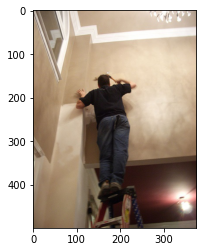

Man In Red Shirt Is Sitting On Bench


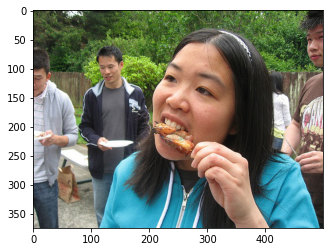

Young Boy Is Holding Her Arms In The Air


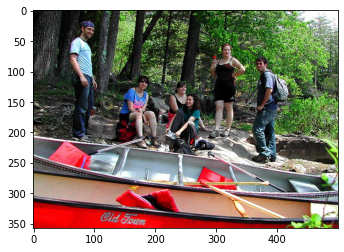

Two People Are Playing In The Water


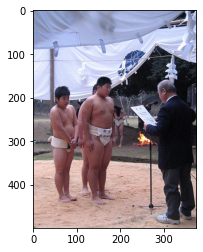

Two Children Are Playing In The Water


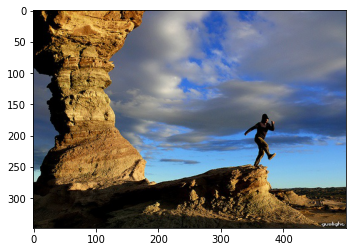

Man In Red Shirt Is Climbing Rock Face


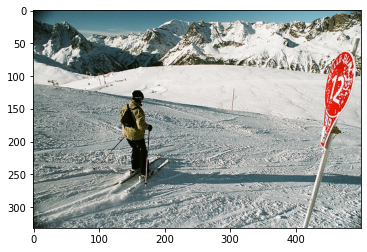

Man In Red Shirt Is Riding Bike


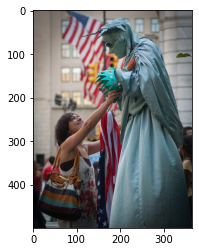

Two Girls Are Sitting On The Street


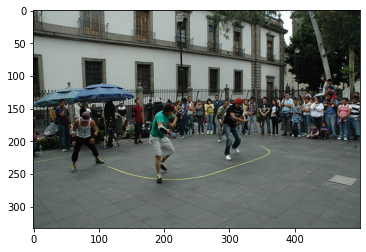

Man In Black Shirt Is Standing On The Street


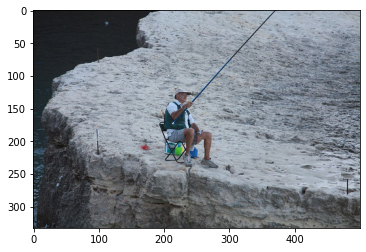

Man In Red Shirt Is Climbing Rock Face


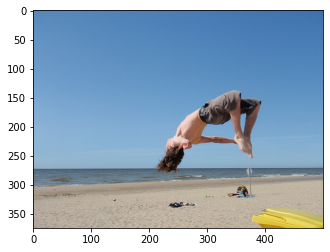

The Man Is Standing On The Beach


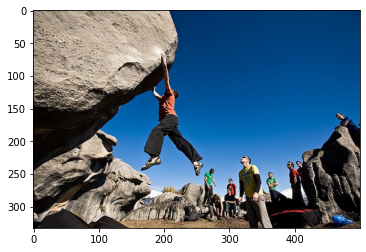

Man In Red Shirt Is Climbing Rock


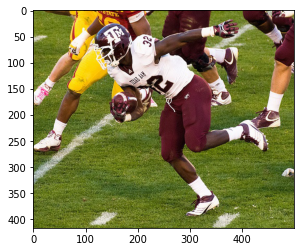

Man In Red Shirt Is Riding Unicycle


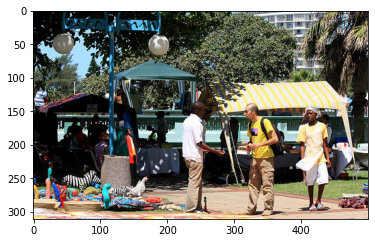

Two Girls Are Playing In The Water


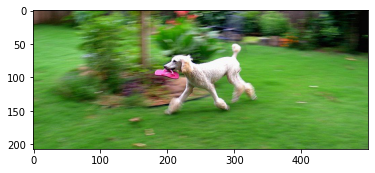

Dog Is Running Through The Grass


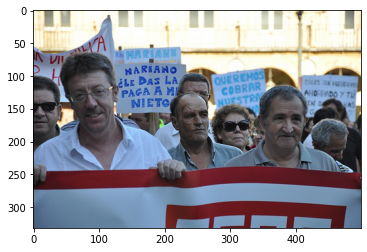

Man In Red Shirt Is Sitting On The Street


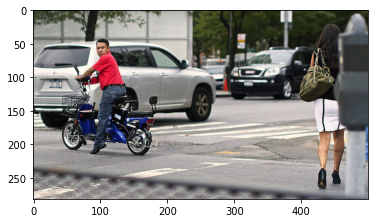

Man In Red Shirt Is Standing On Bench


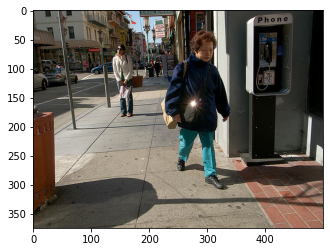

Two Children Are Playing On The Grass


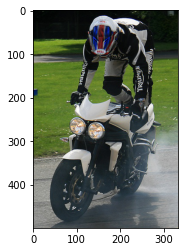

Man Is Riding Bike On Dirt Bike


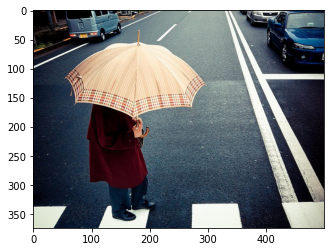

Man In Red Shirt Is Sitting On The Edge Of The Beach


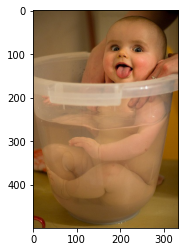

The Little Boy Is Wearing Blue Shirt And Jeans And Jeans Is Playing In The Water


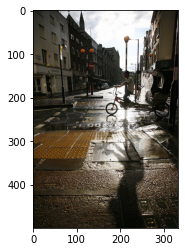

Man In Black Shirt Is Standing On The Street


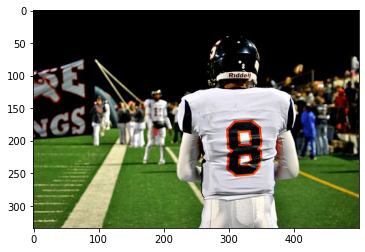

Man In Red Shirt Is Riding Unicycle


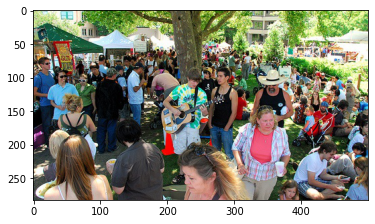

Man In Red Shirt Is Sitting On The Street


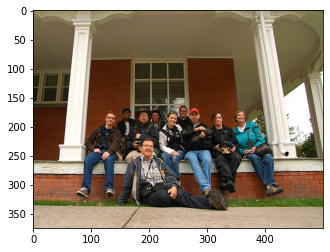

Man In Black Shirt Is Standing On The Street


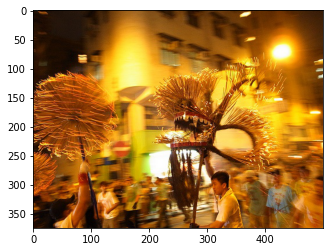

Man In Black Shirt Is Sitting On The Street


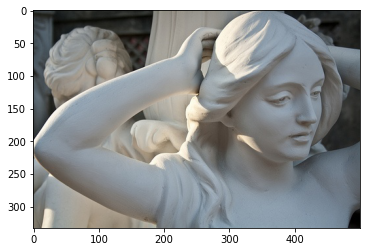

Two Girls Are Sitting On The Street


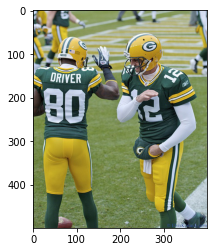

Man In Red Shirt Is Riding Unicycle


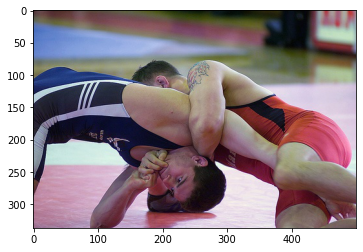

Little Boy Is Standing On The Grass


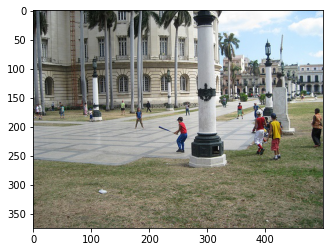

Man In Black Shirt Is Sitting On The Street


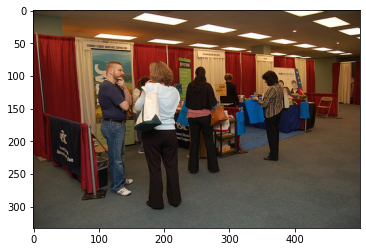

Man In Black Shirt Is Sitting On The Street


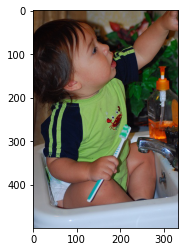

Man In Blue Shirt Is Sitting On The Edge Of Rock


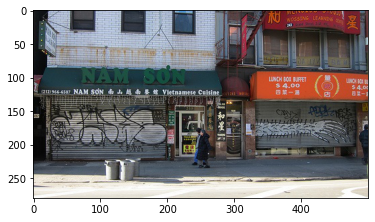

Man In Black Shirt And White Hat Is Sitting On The Street


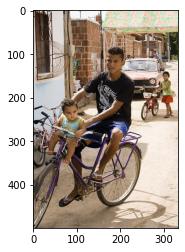

Man In Red Shirt Is Riding Bike


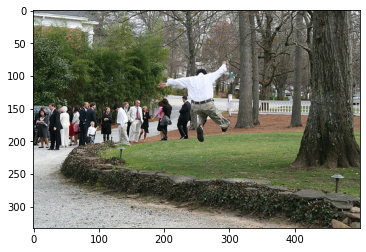

Man In Red Shirt Is Standing On The Street


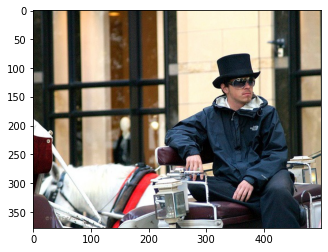

Man In Red Shirt Is Sitting On Bench


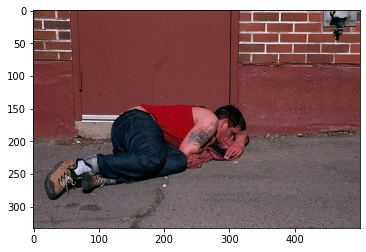

Little Boy Is Sitting On The Grass


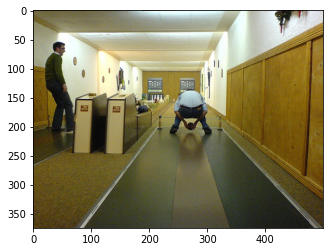

Man In Black Shirt Is Standing On The Street


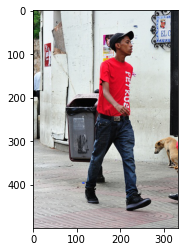

Two Girls Are Playing In The Grass


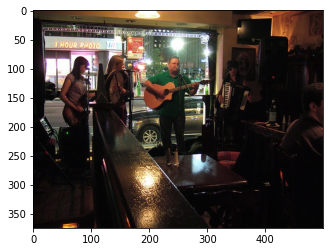

Man In Black Shirt Is Sitting On Bench


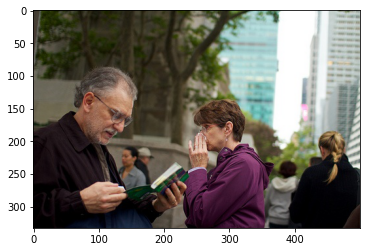

Man In Red Shirt Is Sitting On Bench


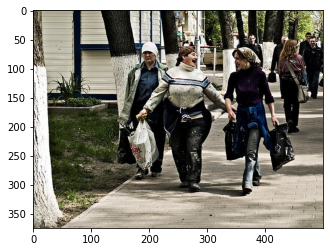

Man In Red Shirt Is Standing On The Street


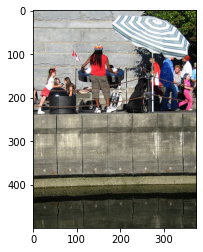

Man In Red Shirt Is Standing On The Street


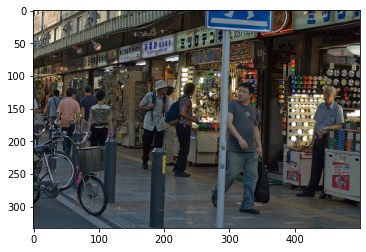

Man In Black Shirt And White Hat Is Sitting On The Street


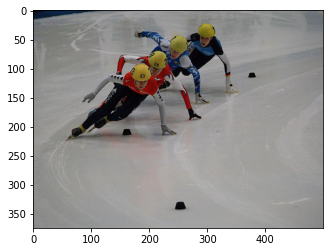

Man In Red Shirt Is Riding Bike


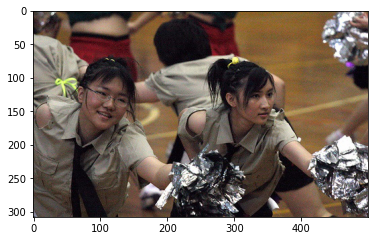

Man In Red Shirt Is Sitting On The Street


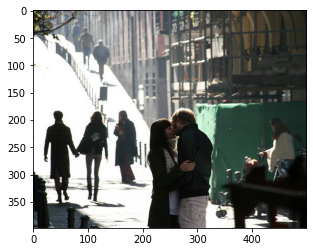

Man In Black Shirt Is Sitting On The Street


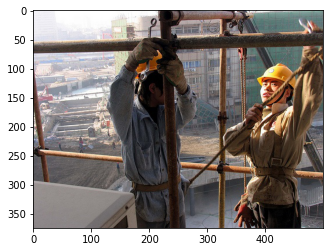

Man In Red Shirt Is Standing On The Beach


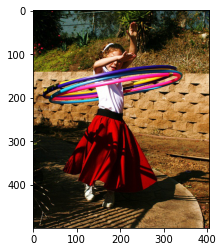

Man In Red Shirt Is Sitting On The Street


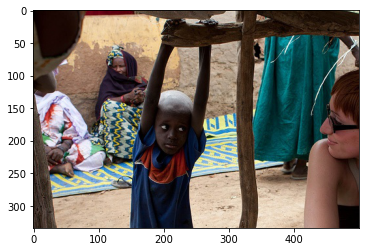

Two Girls Are Playing In The Grass


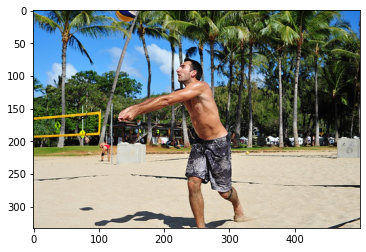

Two Girls Are Playing In The Water


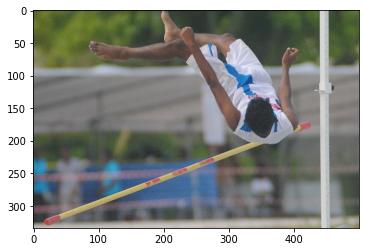

Young Boy Is Jumping Into The Air


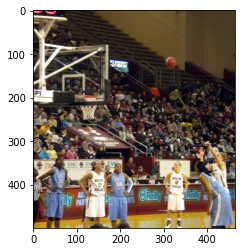

Man In Red Shirt Is Riding Unicycle


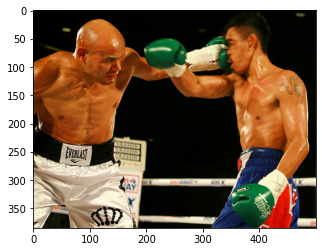

Two Girls Are Playing In The Air


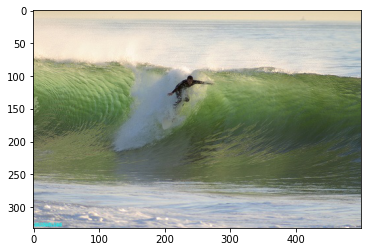

Dog Is Running Through The Water


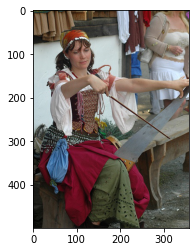

Two Girls Are Playing In The Grass


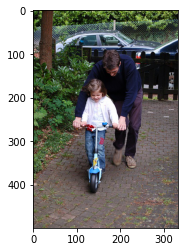

Young Boy Is Standing On The Sidewalk


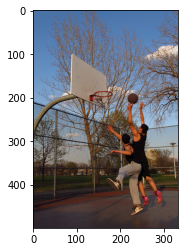

Man In Red Shirt Is Standing On The Street


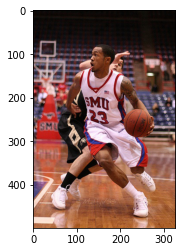

Man In Red Shirt Is Jumping Over The Ground


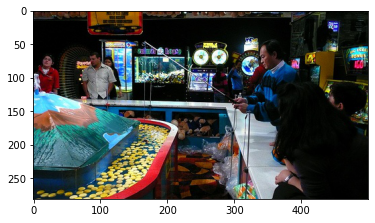

Man In Red Shirt And Hat Is Sitting On The Street


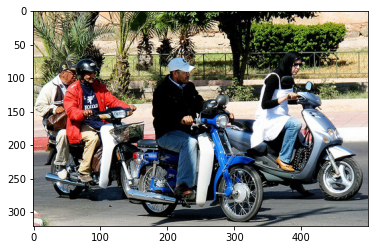

Man In Red Shirt Is Standing On Bench


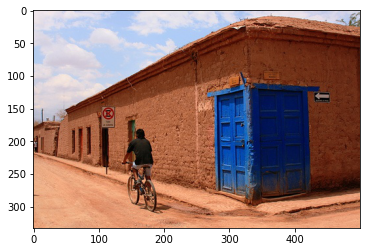

Man In Black Shirt Is Standing On The Street


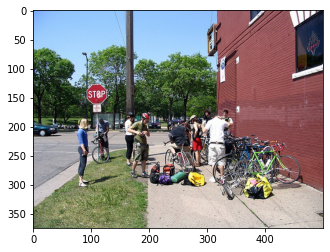

Man In Black Shirt Is Standing On The Street


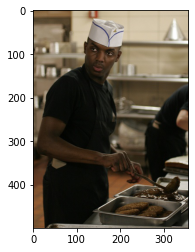

Man In Red Shirt Is Sitting On Bench


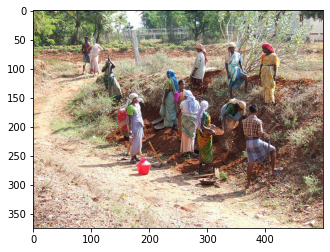

The Man Is Sitting On The Edge Of The Grass


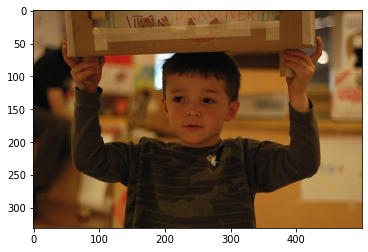

Two Girls Are Sitting On The Street


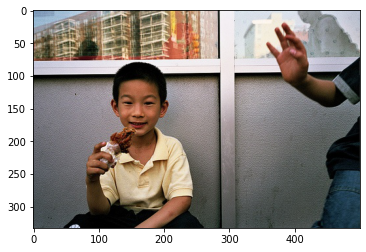

Woman In Red Shirt Is Holding Her Head In The Street


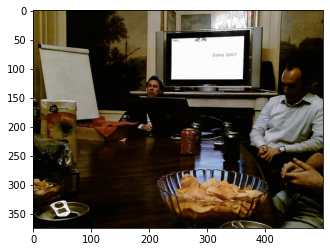

Woman With His Head In Front Of The Camera


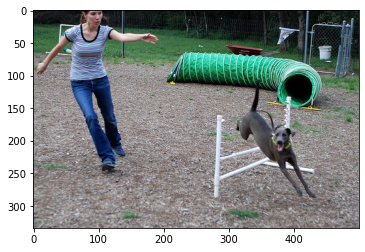

Two Girls Are Playing In The Grass


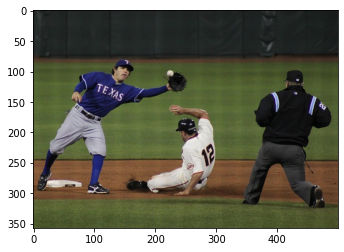

Man In Red Shirt Is Riding Unicycle


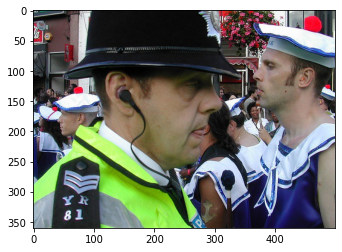

Two Girls Are Playing In The Grass


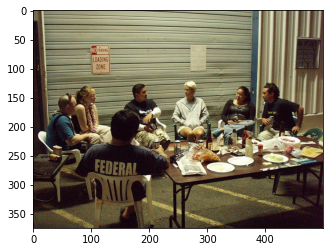

Man In Black Shirt Is Sitting On Bench


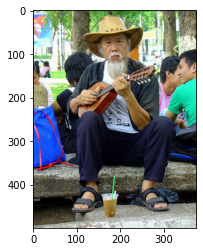

Man In Red Shirt Is Sitting On Bench


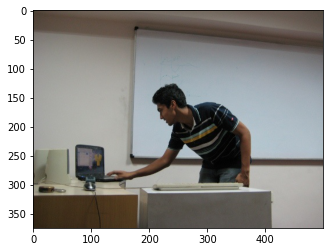

Man In Black Shirt Is Sitting On Bench


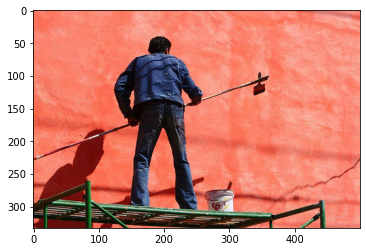

Man In Red Shirt Is Sitting On The Street


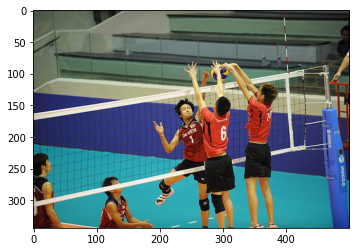

Young Boy Is Jumping Into The Air


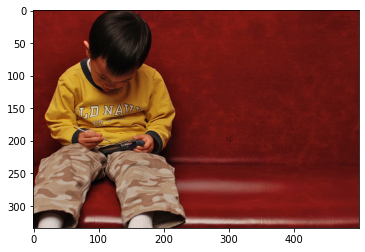

Woman With Glasses And Sunglasses Is Sitting On Bench


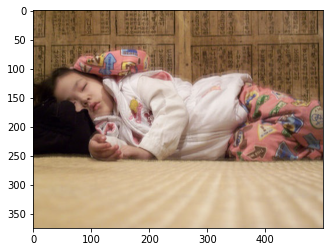

Young Boy Is Sitting On The Sidewalk


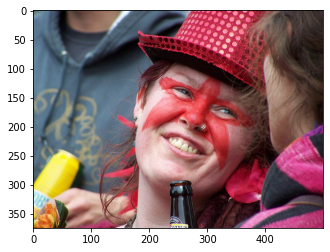

Woman With Glasses And Sunglasses Is Holding Baby


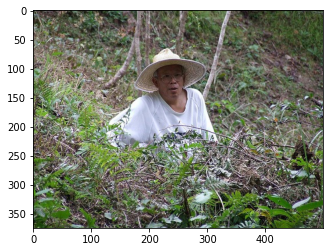

Two Children Are Playing In The Grass


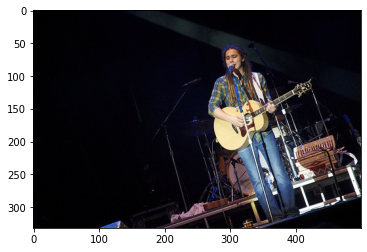

Man In Black Shirt Is Sitting On The Street


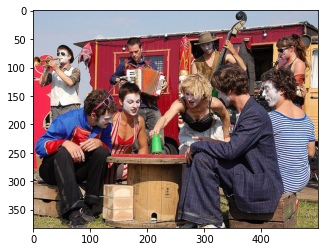

Man In Red Shirt Is Sitting On The Street


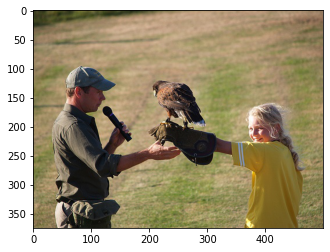

Two Dogs Are Playing In The Grass


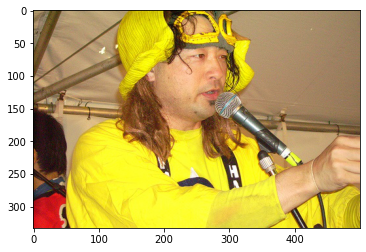

Man In Red Shirt Is Sitting On Bench


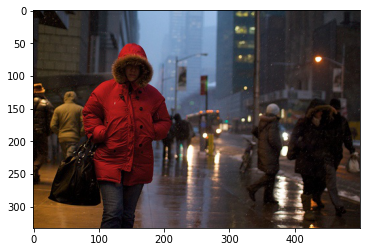

Man In Black Shirt Is Sitting On The Street


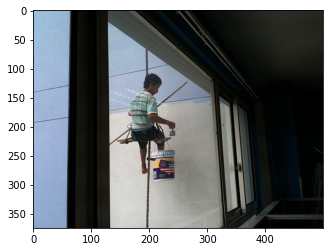

Man In Black Shirt Is Standing On The Street


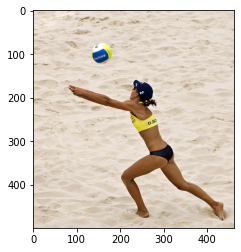

Two Children Are Playing In The Water


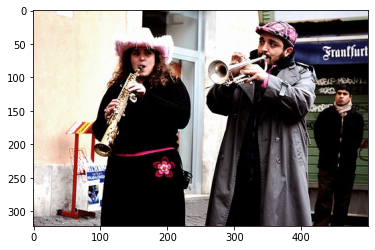

Man In Black Shirt And White Hat Is Sitting On Bench


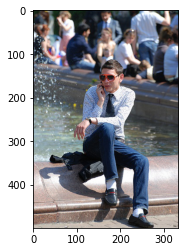

Man In Black Shirt Is Standing On The Edge Of The Water


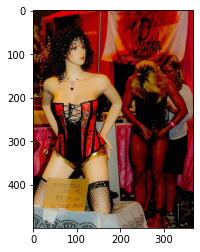

Man In Black Shirt Is Sitting On Bench


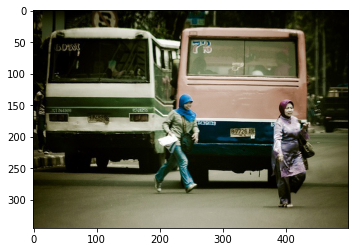

Man In Red Shirt Is Standing On The Street


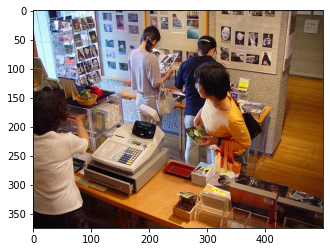

Man In Black Shirt Is Sitting On Bench


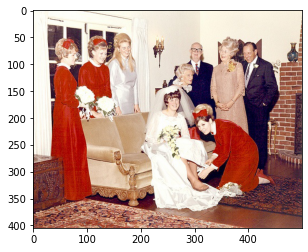

Man In Red Shirt Is Sitting On The Street


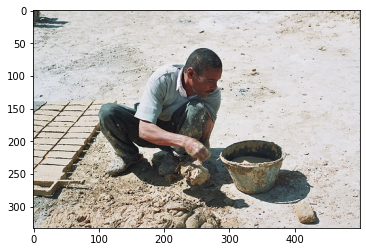

The Man Is Sitting On Bench


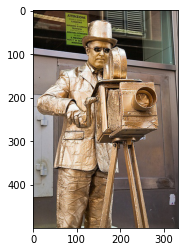

Man In Black Shirt Is Sitting On The Street


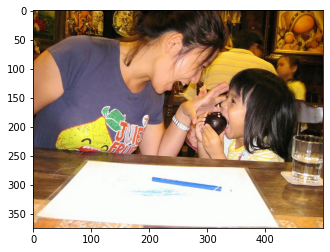

The Man Is Sitting On The Street


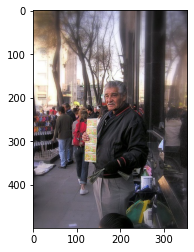

Man In Red Shirt Is Standing On Bench


In [35]:
#Generate Captions for a Fresh Image

from pickle import load
from numpy import argmax
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model

# extract features from each photo in the directory
def extract_features(filename):
	# load the model
	model = VGG16()
	# re-structure the model
	model.layers.pop()
	model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
	# load the photo
	image = load_img(filename, target_size=(224, 224))
	# convert the image pixels to a numpy array
	image = img_to_array(image)
	# reshape data for the model
	image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
	# prepare the image for the VGG model
	image = preprocess_input(image)
	# get features
	feature = model.predict(image, verbose=0)
	return feature

# load the tokenizer
tokenizer = create_tokenizer(train_descriptions)
# pre-define the max sequence length (from training)
max_length = 34
# load the model
model = load_model('./model_12.h5')
# load and prepare the photograph
for root, dirs, files in os.walk('../input/flickr-test'):
    for file in files:
        img = root+'/'+file
        x = plt.imread(img)
        plt.imshow(x)
        plt.show()
        photo = extract_features(img)
        # generate description
        description = generate_desc(model, tokenizer, photo, max_length)
        query = description
        stopwords = ['startseq','endseq']
        querywords = query.split()

        resultwords  = [word for word in querywords if word.lower() not in stopwords]
        result = ' '.join(resultwords)

        print(result.title())